In [ ]:
from google.colab import files
files.upload()

Saving dataset_for_technical_assessment.csv to dataset_for_technical_assessment.csv


In [ ]:
!pip install catboost
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from prophet import Prophet
from tqdm.notebook import trange, tqdm
from pandas import Series
from matplotlib import pyplot
from statsmodels.tsa.seasonal import seasonal_decompose
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from catboost import CatBoostRegressor
from sklearn.metrics import mean_absolute_error
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error
from prophet.plot import plot_plotly, plot_components_plotly
from statsmodels.api import datasets

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
data_train = pd.read_csv('dataset_for_technical_assessment.csv')
display(data_train.head())
data_train.info()

,Description,y1,y2,x1,x2,x3,x4,x5,x6,x7,x8
0,2016-01-01 00:00:00,0.008133,0.805288,0.934119,0.182838,0.282637,0.612302,0.218844,0.036615,0.695623,0.286383
1,2016-01-01 00:05:00,0.008964,0.799772,0.934014,0.180689,0.281720,0.611908,0.220869,0.037616,0.693026,0.296014
2,2016-01-01 00:10:00,0.008906,0.809219,0.934031,0.181439,0.282202,0.610927,0.222187,0.034264,0.692654,0.289457
3,2016-01-01 00:15:00,0.008469,0.804602,0.934367,0.182620,0.282305,0.612801,0.221935,0.034894,0.693397,0.290959
4,2016-01-01 00:20:00,0.006882,0.799026,0.934884,0.180871,0.281051,0.610566,0.218883,0.038596,0.690928,0.287653


<class 'pandas.core.frame.DataFrame'>
RangeIndex: 157812 entries, 0 to 157811
Data columns (total 11 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   Description  157812 non-null  object 
 1   y1           157738 non-null  float64
 2   y2           157738 non-null  float64
 3   x1           157738 non-null  float64
 4   x2           157812 non-null  float64
 5   x3           157812 non-null  float64
 6   x4           157742 non-null  float64
 7   x5           157738 non-null  float64
 8   x6           157738 non-null  float64
 9   x7           157812 non-null  float64
 10  x8           157812 non-null  float64
dtypes: float64(10), object(1)
memory usage: 13.2+ MB


In [ ]:
data_train.isnull().sum().sort_values(ascending=False)

y1             74
y2             74
x1             74
x5             74
x6             74
x4             70
Description     0
x2              0
x3              0
x7              0
x8              0
dtype: int64

In [ ]:
data_train = data_train.dropna().reset_index(drop=True)

In [ ]:
data_train.Description = pd.to_datetime(data_train.Description)

In [ ]:
df1 = data_train.melt(id_vars=['Description'], var_name = 'val').query("val in ['y1', 'y2']")
px.line(df1, x='Description', y='value', color='val' ).show()

In [ ]:
data_train['y'] = data_train['y1'] + data_train['y2']
fig = px.line(data_train, x='Description', y="y", title='y1 + y2')
fig.show()

In [ ]:
def group(row): 
    
    if row['y'] > 1:
        return (row['y1'] + row['y2']) / 2

    return row['y']
data_train['y'] = data_train.apply(group, axis=1) # create a column with the received values


In [ ]:
fig = px.line(data_train, x='Description', y="y", title='y1 + y2')
fig.show()

In [ ]:
fig = px.box(data_train, y="y", title='y1 + y2')
fig.show()

In [ ]:
data_train = data_train.query('y < 0.921 and y > 0.6')

In [ ]:
data_train = data_train.drop(['y1', 'y2'], axis=1)

<ipython-input-17-c646b254c4ac>:3: DeprecationWarning:

`np.bool` is a deprecated alias for the builtin `bool`. To silence this warning, use `bool` by itself. Doing this will not modify any behavior and is safe. If you specifically wanted the numpy scalar type, use `np.bool_` here.
Deprecated in NumPy 1.20; for more details and guidance: https://numpy.org/devdocs/release/1.20.0-notes.html#deprecations



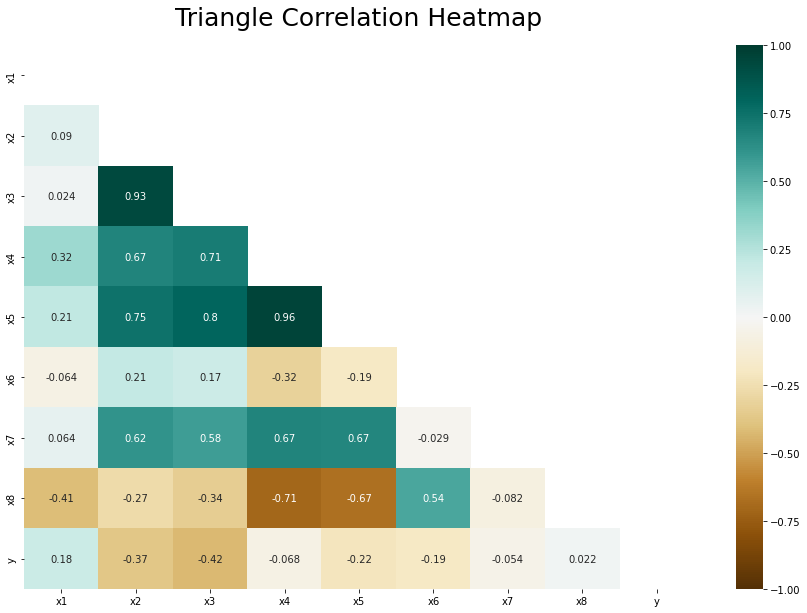

In [ ]:
plt.figure(figsize=(15, 10)) 

mask = np.triu(np.ones_like(data_train.corr(), dtype=np.bool)) 
heatmap = sns.heatmap(data_train.corr(), mask=mask, vmin=-1, vmax=1, annot=True, cmap='BrBG') 
heatmap.set_title('Triangle Correlation Heatmap', fontdict={'fontsize':25}, pad=20);

In [ ]:
data_train['x23'] = (data_train['x2'] + data_train['x3']) / 2
data_train = data_train.drop(['x2', 'x3'], axis=1)


data_train = data_train.drop('x4', axis=1)

In [ ]:
df1 = data_train.melt(id_vars=['Description'], var_name = 'val').query("val in ['x1', 'x23', 'x5', 'x6','x7','x8']")
p = px.line(df1, x='Description', y='value', color='val' )
p.show()

In [ ]:
df = data_train.groupby(pd.Grouper(key="Description", freq="h")).sum()
df

In [ ]:
fig = px.box(df.query('y < 11 and y > 7.5'), y="y", title='y1 + y2')
fig.show()

In [ ]:
df = df.query('y < 11 and y > 7.5')

In [ ]:
fig = px.line(df, x=df.index, y="y", title='y1 + y2')
fig.show()

In [ ]:
df = data_train.groupby(pd.Grouper(key="Description", freq="h")).sum()
df = df.query('y < 11 and y > 7.5')
df = df.rename(columns = {'index':'Description'})
df.reset_index(inplace=True)
# del data
data = df[['Description', 'y']]
data.rename(columns = {'Description' : 'ds'}, inplace = True)
data

/usr/local/lib/python3.8/dist-packages/pandas/core/frame.py:5039: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy



,ds,y
0,2016-01-01 00:00:00,9.732940
1,2016-01-01 01:00:00,9.727397
2,2016-01-01 02:00:00,9.723904
3,2016-01-01 03:00:00,9.719047
4,2016-01-01 04:00:00,9.722029
...,...,...
12948,2017-07-01 19:00:00,8.863126
12949,2017-07-01 20:00:00,8.871590
12950,2017-07-01 21:00:00,8.854656
12951,2017-07-01 22:00:00,8.850790


In [ ]:
%%time

wrong = pd.DataFrame({
'holiday': 'wrong',
'ds': pd.to_datetime(['2017-05-02', '2017-05-03', '2017-05-04', '2017-05-05', '2017-05-06', '2017-05-07', '2017-05-08']),
'lower_window': -1,
'upper_window': 1,
})

m = Prophet(holidays = wrong,
            growth="linear", 
            daily_seasonality=True, 
            yearly_seasonality = False,
            weekly_seasonality = False,
            seasonality_mode = "multiplicative",
            changepoint_prior_scale = 0.1,
            seasonality_prior_scale = 35
            )

m.add_seasonality(name="monthly",period=30, fourier_order = 3)
m.add_seasonality(name="weekly",
                                period = 7,
                                fourier_order = 40)
# m.add_seasonality(name="yearly", 
#                                 period=365.25,
#                                 fourier_order = 35)
m.add_seasonality(name="quarter",
                                period=365.25 / 4,
                                fourier_order = 5,
                                prior_scale = 5)
m.add_seasonality(name="1/2year",
                                period=365.25 / 2,
                                fourier_order = 5,
                                prior_scale = 5)
# m.add_country_holidays(country_name = 'US')

m.fit(data)
future = m.make_future_dataframe(periods= 14*24, freq='h',  include_history = False)
forecast1 = m.predict(future)

forecast1[['ds', 'yhat', 'yhat_lower', 'yhat_upper']]

DEBUG:cmdstanpy:input tempfile: /tmp/tmpql_iuc8b/rxauxl9n.json
DEBUG:cmdstanpy:input tempfile: /tmp/tmpql_iuc8b/d_yj9yjc.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/usr/local/lib/python3.8/dist-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=81047', 'data', 'file=/tmp/tmpql_iuc8b/rxauxl9n.json', 'init=/tmp/tmpql_iuc8b/d_yj9yjc.json', 'output', 'file=/tmp/tmpql_iuc8b/prophet_modelq0_4vd4k/prophet_model-20221216024504.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
02:45:04 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
02:46:14 - cmdstanpy - INFO - Chain [1] done processing
INFO:cmdstanpy:Chain [1] done processing


CPU times: user 5.16 s, sys: 448 ms, total: 5.61 s
Wall time: 1min 15s


,ds,yhat,yhat_lower,yhat_upper
0,2017-07-02 00:00:00,8.813305,8.491025,9.109686
1,2017-07-02 01:00:00,8.806621,8.482790,9.115799
2,2017-07-02 02:00:00,8.797246,8.493086,9.118629
3,2017-07-02 03:00:00,8.792269,8.477295,9.124636
4,2017-07-02 04:00:00,8.794060,8.493334,9.110432
...,...,...,...,...
331,2017-07-15 19:00:00,7.871599,7.444785,8.352265
332,2017-07-15 20:00:00,7.864305,7.435978,8.315982
333,2017-07-15 21:00:00,7.858635,7.421673,8.322011
334,2017-07-15 22:00:00,7.855493,7.441575,8.334639


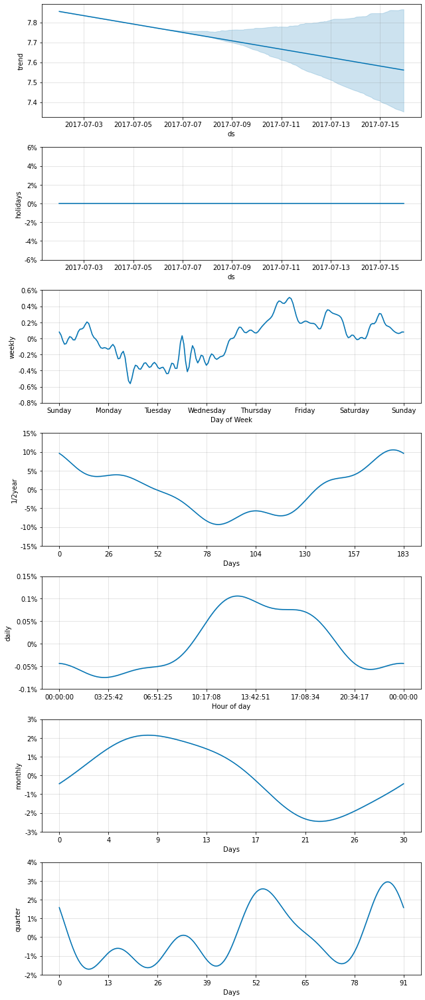

In [ ]:
fig2 = m.plot_components(forecast1)

In [ ]:

plot_plotly(m, forecast1)

In [ ]:
forecastdf = forecast1[['ds', 'yhat']].rename(columns = {'ds':'Description', 'yhat': 'y'})
data = pd.concat([df, forecastdf])
data

,Description,x1,x5,x6,x7,x8,y,x23
0,2016-01-01 00:00:00,11.209929,2.658118,0.413460,8.316115,3.464308,9.732940,2.789811
1,2016-01-01 01:00:00,11.219276,2.665111,0.397624,8.348311,3.464199,9.727397,2.800944
2,2016-01-01 02:00:00,11.211022,2.678502,0.396981,8.336585,3.436114,9.723904,2.803272
3,2016-01-01 03:00:00,11.219144,2.673676,0.381165,8.343253,3.419158,9.719047,2.813715
4,2016-01-01 04:00:00,11.217804,2.680561,0.406043,8.394281,3.460036,9.722029,2.803416
...,...,...,...,...,...,...,...,...
331,2017-07-15 19:00:00,NaN,NaN,NaN,NaN,NaN,7.871599,NaN
332,2017-07-15 20:00:00,NaN,NaN,NaN,NaN,NaN,7.864305,NaN
333,2017-07-15 21:00:00,NaN,NaN,NaN,NaN,NaN,7.858635,NaN
334,2017-07-15 22:00:00,NaN,NaN,NaN,NaN,NaN,7.855493,NaN


In [ ]:
data = data.groupby(pd.Grouper(key="Description", freq="h")).sum()
data = data.rename(columns = {'index':'Description'})
data

In [ ]:
for i in trange(1, len(df.columns)):
    if df.columns[i] != 'y':
        print(df.columns[i])

  0%|          | 0/7 [00:00<?, ?it/s]

x1
x5
x6
x7
x8
x23


In [ ]:
def make_features(data, max_lag, rolling_mean_size):
     # four new calendar attributes: year, month, day and day of the week
    data['year'] = data.index.year
    data['month'] = data.index.month
    data['day'] = data.index.day
    data['dayofweek'] = data.index.dayofweek
    
    # lagging values. max_lag, which will set the maximum lag size.
    for i in trange(1, len(df.columns)):
        for lag in range(1, max_lag + 1):
            if df.columns[i] != 'y':
                data['lag_{}'.format(lag)] = data[df.columns[i]].shift(lag)

    # moving average
    # data['rolling_mean'] = data['x1'].shift().rolling(rolling_mean_size).mean()

make_features(data, 14*24, 5)
data

  0%|          | 0/7 [00:00<?, ?it/s]

<ipython-input-31-d40ab3be6fa0>:13: PerformanceWarning:

DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead.  To get a de-fragmented frame, use `newframe = frame.copy()`



,x1,x5,x6,x7,x8,y,x23,year,month,day,...,lag_327,lag_328,lag_329,lag_330,lag_331,lag_332,lag_333,lag_334,lag_335,lag_336
Description,,,,,,,,,,,,,,,,,,,,,
2016-01-01 00:00:00,11.209929,2.658118,0.413460,8.316115,3.464308,9.732940,2.789811,2016,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-01-01 01:00:00,11.219276,2.665111,0.397624,8.348311,3.464199,9.727397,2.800944,2016,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-01-01 02:00:00,11.211022,2.678502,0.396981,8.336585,3.436114,9.723904,2.803272,2016,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-01-01 03:00:00,11.219144,2.673676,0.381165,8.343253,3.419158,9.719047,2.813715,2016,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2016-01-01 04:00:00,11.217804,2.680561,0.406043,8.394281,3.460036,9.722029,2.803416,2016,1,1,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2017-07-15 19:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,7.871599,0.000000,2017,7,15,...,0.0,0.0,0.0,0.0,0.0,7.726191,7.685894,7.799765,7.687958,7.982882
2017-07-15 20:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,7.864305,0.000000,2017,7,15,...,0.0,0.0,0.0,0.0,0.0,0.000000,7.726191,7.685894,7.799765,7.687958
2017-07-15 21:00:00,0.000000,0.000000,0.000000,0.000000,0.000000,7.858635,0.000000,2017,7,15,...,0.0,0.0,0.0,0.0,0.0,0.000000,0.000000,7.726191,7.685894,7.799765


In [ ]:
data_split = data[:-(14*24)]
test = data[-(14*24):]
train, valid = np.split(data.sample(frac=1, random_state=12345),
                                 [int(.85*len(data))])

train = train.dropna()
valid = valid.dropna()
test = test.dropna()
# variables for features and target feature
features_train = train.drop(['y'], axis=1)
target_train = train['y']

features_valid = valid.drop(['y'], axis=1)
target_valid = valid['y']

features_test = test.drop(['y'], axis=1)
target_test = test['y']
print(train.shape)
print(valid.shape)
print(test.shape)

(11166, 347)
(1986, 347)
(336, 347)


In [ ]:
train

,x1,x5,x6,x7,x8,y,x23,year,month,day,...,lag_327,lag_328,lag_329,lag_330,lag_331,lag_332,lag_333,lag_334,lag_335,lag_336
Description,,,,,,,,,,,,,,,,,,,,,
2016-10-08 11:00:00,11.253067,3.010748,0.528032,7.795902,3.252937,10.313322,6.111956,2016,10,8,...,2.868887,2.627219,2.566837,2.602478,2.557020,2.571130,2.583440,2.599533,2.593813,2.595567
2017-01-30 08:00:00,11.115070,3.010581,0.577833,8.351381,3.705801,8.217169,7.197706,2017,1,30,...,6.653948,6.570296,6.312357,6.466771,6.628276,6.596143,6.430741,6.310186,6.331248,6.579371
2016-01-26 03:00:00,11.266804,3.643985,0.105328,8.070828,1.148432,9.317771,5.338487,2016,1,26,...,2.685773,2.432569,2.479425,2.455241,2.477819,2.529091,2.489832,2.552083,2.526770,2.781347
2016-07-20 17:00:00,11.237799,2.634750,0.474905,7.648609,3.471667,9.641120,2.424349,2016,7,20,...,2.438214,2.381791,2.372027,2.350378,2.336056,2.387094,2.319385,2.306426,2.295206,2.301943
2017-04-26 05:00:00,11.291246,3.165377,0.511983,8.330932,2.652560,8.509326,6.457606,2017,4,26,...,8.598917,8.645188,8.703397,8.927441,8.897235,8.977586,9.001937,9.001712,8.986166,8.953396
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2016-02-03 17:00:00,11.267109,3.836435,0.080690,8.402803,1.155792,9.409411,5.832196,2016,2,3,...,5.532182,5.545710,5.532178,5.550082,5.563683,5.539027,5.536066,5.527224,5.547831,5.573260
2016-08-26 04:00:00,11.228708,2.656113,0.407148,7.684268,3.192549,9.460089,2.528521,2016,8,26,...,2.454768,2.417673,2.450824,2.469315,2.469809,2.487441,2.485394,2.425154,2.430115,2.399678
2016-08-16 05:00:00,11.215861,2.703080,0.399533,7.621287,2.986620,9.424242,2.786193,2016,8,16,...,2.650711,2.644253,2.645335,2.641561,2.660115,2.582797,2.569653,2.592404,2.549779,2.553220


In [ ]:
%%time

model = LinearRegression()
model = model.fit(features_train, target_train)
predictions_valid = model.predict(features_valid)
mse = mean_squared_error(target_valid, predictions_valid)
print("MSE:", mse)
rmse = mse ** 0.5 
print("RMSE:", rmse)

MSE: 1.1788686255379315
RMSE: 1.085757166929112
CPU times: user 586 ms, sys: 117 ms, total: 704 ms
Wall time: 470 ms


Text(0, 0.5, 'values')

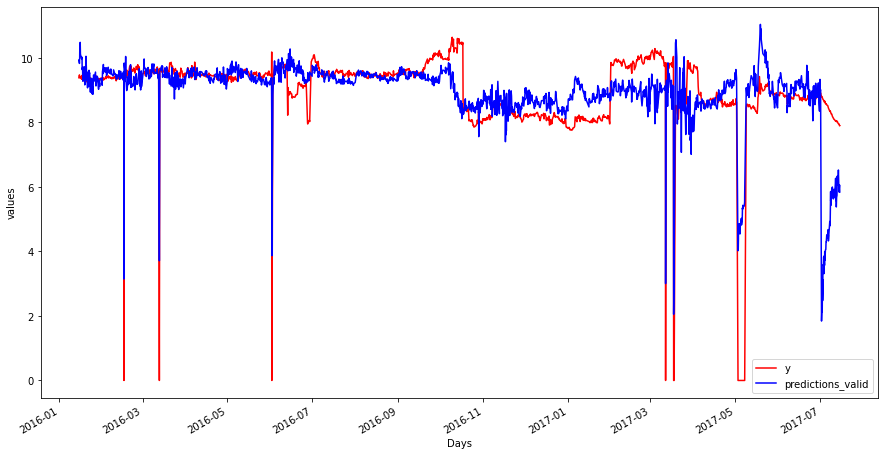

In [ ]:
targetv1= pd.DataFrame(target_valid)
targetv1['predictions_valid'] = predictions_valid

targetv1.plot( color=['red', 'blue'], figsize=(15,8))
# Add Title and Labels
plt.title('')
plt.xlabel('Days')
plt.ylabel('values')

In [ ]:
%%time
model1 = CatBoostRegressor(iterations=100, learning_rate=0.5, depth = 8)
# Fit model
model1.fit(features_train, target_train, verbose=10) 
predictions_valid1 = model1.predict(features_valid)
mse1 = mean_squared_error(target_valid, predictions_valid1)
print("MSE:", mse1)
rmse1 = mse1 ** 0.5 
print("RMSE:", rmse1)

0:	learn: 0.7441250	total: 1.11s	remaining: 1m 50s
10:	learn: 0.1647095	total: 4.43s	remaining: 35.8s
20:	learn: 0.1163462	total: 7.31s	remaining: 27.5s
30:	learn: 0.0939995	total: 10.3s	remaining: 23s
40:	learn: 0.0806195	total: 13.2s	remaining: 19s
50:	learn: 0.0711442	total: 16s	remaining: 15.4s
60:	learn: 0.0640805	total: 18.9s	remaining: 12.1s
70:	learn: 0.0592612	total: 21.8s	remaining: 8.91s
80:	learn: 0.0540231	total: 24.7s	remaining: 5.79s
90:	learn: 0.0495257	total: 27.5s	remaining: 2.72s
99:	learn: 0.0461663	total: 30.2s	remaining: 0us
MSE: 0.008945310167465538
RMSE: 0.09457964985907664
CPU times: user 56.5 s, sys: 866 ms, total: 57.4 s
Wall time: 31.2 s


Text(0, 0.5, 'values')

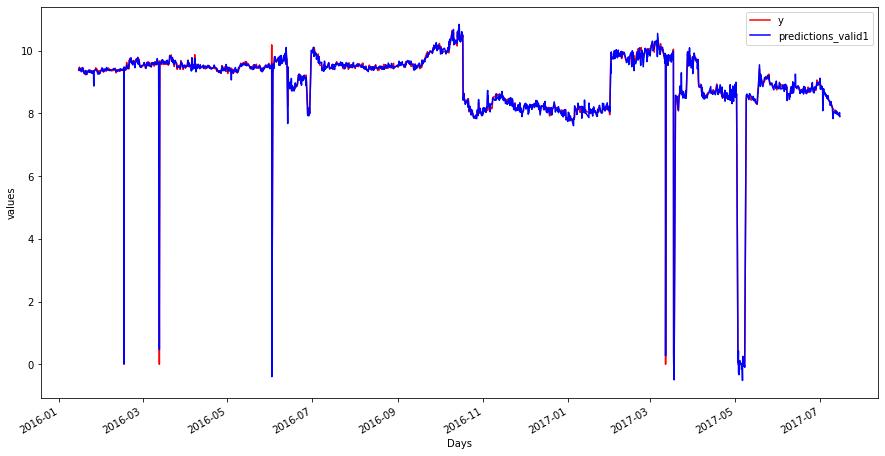

In [ ]:
targetv2= pd.DataFrame(target_valid)
targetv2['predictions_valid1'] = predictions_valid1

targetv2.plot( color=['red', 'blue'], figsize=(15,8))
# Add Title and Labels
plt.title('')
plt.xlabel('Days')
plt.ylabel('values')

In [ ]:
%%time
model4 = RandomForestRegressor(n_estimators=100, max_depth = 13)
model4.fit(features_train, target_train) 
predictions_valid4 = model4.predict(features_valid)
mse4 = mean_squared_error(target_valid, predictions_valid4)
print("MSE:", mse4)
rmse4 = mse4 ** 0.5 
print("RMSE:", rmse4)

MSE: 0.0035735173195037178
RMSE: 0.05977890363249997
CPU times: user 4min 50s, sys: 309 ms, total: 4min 51s
Wall time: 4min 58s


Text(0, 0.5, 'values')

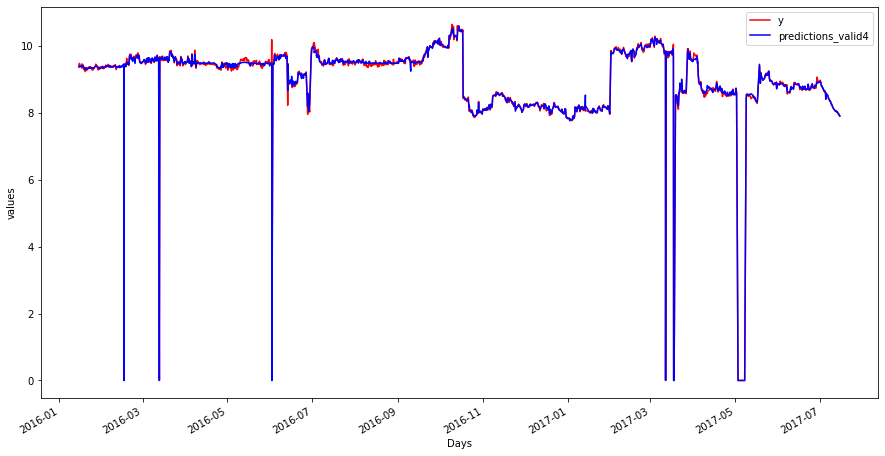

In [ ]:
targetv= pd.DataFrame(target_valid)
targetv['predictions_valid4'] = predictions_valid4

targetv.plot( color=['red', 'blue'], figsize=(15,8))
# Add Title and Labels
plt.title('')
plt.xlabel('Days')
plt.ylabel('values')

In [ ]:
%%time
predictions_test = model1.predict(features_test)
mse1 = mean_squared_error(target_test, predictions_test)
print("MSE:", mse1)
rmse1 = mse1 ** 0.5 
print("RMSE:", rmse1)

MSE: 0.004078315858244003
RMSE: 0.06386169319900627
CPU times: user 25.2 ms, sys: 4.99 ms, total: 30.2 ms
Wall time: 55.6 ms


Text(0, 0.5, 'values')

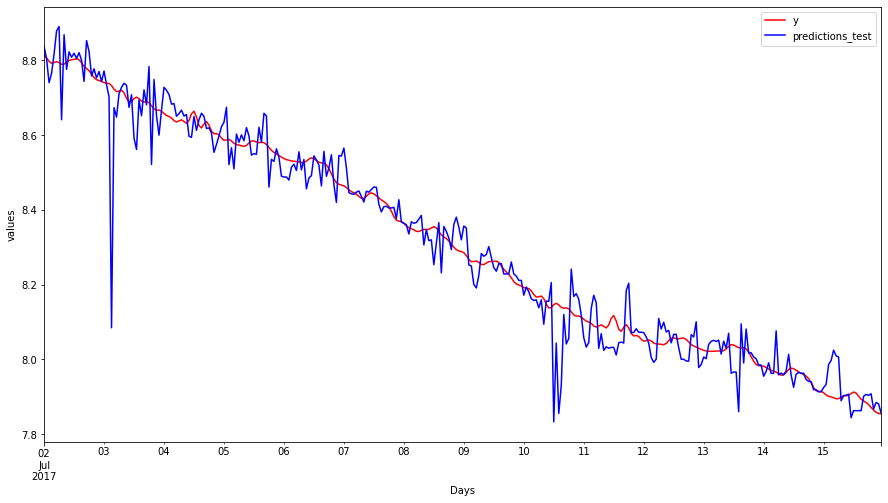

In [ ]:
fin= pd.DataFrame(target_test)
fin['predictions_test'] = predictions_test

fin.plot( color=['red', 'blue'], figsize=(15,8))
# Add Title and Labels
plt.title('')
plt.xlabel('Days')
plt.ylabel('values')

In [ ]:
fin


,y,predictions_test
Description,,
2017-07-02 00:00:00,8.813305,8.837488
2017-07-02 01:00:00,8.806621,8.803604
2017-07-02 02:00:00,8.797246,8.740314
2017-07-02 03:00:00,8.792269,8.765302
2017-07-02 04:00:00,8.794060,8.816403
...,...,...
2017-07-15 19:00:00,7.871599,7.908139
2017-07-15 20:00:00,7.864305,7.867467
2017-07-15 21:00:00,7.858635,7.884689


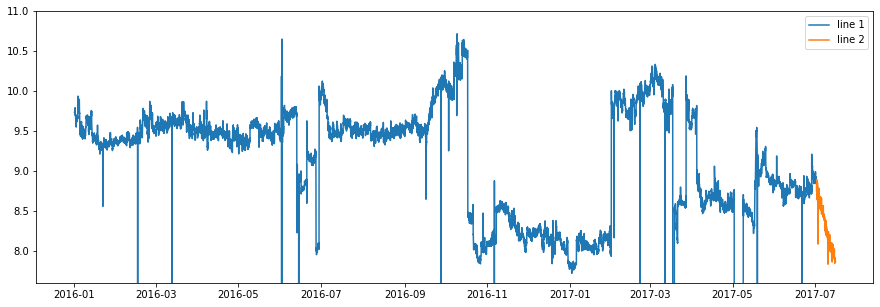

In [ ]:
plt.figure(figsize=(15, 5))
plt.ylim([7.6, 11])
plt.plot(data_split.index, data_split.y, label = "line 1")
plt.plot(fin.index, fin.predictions_test, label= "line 2")
plt.legend()
plt.show()